In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls "/content/drive/My Drive/Esri/"

clipped_dc  shape1  shape1.zip	sidewalk_solution_output


In [4]:
#shape_file = '/content/drive/My Drive/Esri/shape1.zip'

In [5]:
import geopandas as gpd

# Load your shapefile
# gdf = gpd.read_file('/content/drive/My Drive/Esri/shape1/build_sidewalk_build_sidewalk.shp')
gdf = gpd.read_file('/content/drive/My Drive/Esri/sidewalk_solution_output/build_sidewalk.shp')
#gdf = gpd.read_file('/content/drive/My Drive/Esri/clipped_dc/dc_clipped.shp')
print(gdf.head())
print(gdf.crs)


   Join_Count  TARGET_FID        GEOID TRACTCE  m9_2_stree  m9_5_HIN  \
0           1           1  11001001600  001600     0.28443   0.97802   
1           1           2  11001001600  001600     0.28443   0.97802   
2           1           3  11001001600  001600     0.28443   0.97802   
3           1           4  11001001600  001600     0.28443   0.97802   
4           0           5         None    None     0.00000   0.00000   

   m8_2_parks  m8_1_urban  FEATURECOD DESCRIPTIO CAPTUREYEA CAPTUREACT GIS_ID  \
0    0.445024    0.620437           0       None        NaT       None   None   
1    0.445024    0.620437           0       None        NaT       None   None   
2    0.445024    0.620437           0       None        NaT       None   None   
3    0.445024    0.620437           0       None        NaT       None   None   
4    0.000000    0.000000           0       None        NaT       None   None   

   SHAPE_Leng  lightingCo  parkCost  injuryCost  \
0   18.311276     0.71557  0.

In [6]:
print(gdf.geom_type.unique())


['LineString']


In [7]:
print(gdf.geometry.is_empty.sum())       # Should be 0
print(gdf.geometry.is_valid.sum())       # Should match len(gdf)

len(gdf)


0
694795


694795

In [11]:
print(gdf.crs)

# If not, reproject to WGS84
if gdf.crs.to_epsg() != 4326:
    gdf = gdf.to_crs(epsg=4326)


EPSG:4326


In [12]:
print(gdf.columns)


Index(['Join_Count', 'TARGET_FID', 'GEOID', 'TRACTCE', 'm9_2_stree',
       'm9_5_HIN', 'm8_2_parks', 'm8_1_urban', 'FEATURECOD', 'DESCRIPTIO',
       'CAPTUREYEA', 'CAPTUREACT', 'GIS_ID', 'SHAPE_Leng', 'lightingCo',
       'parkCost', 'injuryCost', 'geometry'],
      dtype='object')


In [13]:
print(gdf.head())
#print(gdf.crs)

   Join_Count  TARGET_FID        GEOID TRACTCE  m9_2_stree  m9_5_HIN  \
0           1           1  11001001600  001600     0.28443   0.97802   
1           1           2  11001001600  001600     0.28443   0.97802   
2           1           3  11001001600  001600     0.28443   0.97802   
3           1           4  11001001600  001600     0.28443   0.97802   
4           0           5         None    None     0.00000   0.00000   

   m8_2_parks  m8_1_urban  FEATURECOD DESCRIPTIO CAPTUREYEA CAPTUREACT GIS_ID  \
0    0.445024    0.620437           0       None        NaT       None   None   
1    0.445024    0.620437           0       None        NaT       None   None   
2    0.445024    0.620437           0       None        NaT       None   None   
3    0.445024    0.620437           0       None        NaT       None   None   
4    0.000000    0.000000           0       None        NaT       None   None   

   SHAPE_Leng  lightingCo  parkCost  injuryCost  \
0   18.311276     0.71557  0.

In [16]:
#print(gdf[['SHAPE_Leng']])

        SHAPE_Leng
0        18.311276
1         0.598272
2        19.126367
3        18.951288
4         0.193608
...            ...
694790    8.465030
694791    3.093489
694792   18.425426
694793   90.275094
694794   29.955888

[694795 rows x 1 columns]


In [14]:

gdf = gdf.rename(columns={
    'm9_2_stree': 'Lighting_Raw',
    'm9_5_HIN': 'Injury_Raw',
    'm8_2_parks': 'Parks_Raw',
    'm8_1_urban': 'TreeCanopy_Raw'
})

<Axes: >

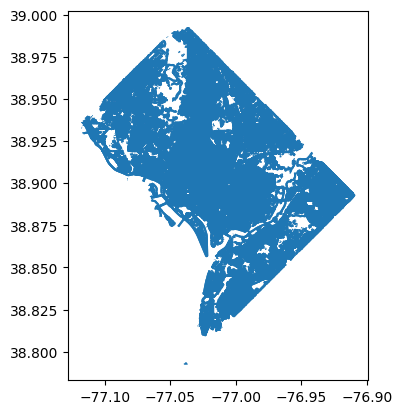

In [45]:
gdf.plot()


In [15]:
# Normalize any missing columns
gdf["SHAPE_Leng"] = gdf["SHAPE_Leng"].fillna(0)
gdf["Lighting_Raw"] = gdf["Lighting_Raw"].fillna(0)
gdf["Injury_Raw"] = gdf["Injury_Raw"].fillna(0)
gdf["Parks_Raw"] = gdf["Parks_Raw"].fillna(0)
gdf["TreeCanopy_Raw"] = gdf["TreeCanopy_Raw"].fillna(0)

# Compute a custom routing cost
#gdf["custom_cost"] = (
 #   gdf["Shape_Leng"] * 1.0
 #   - gdf["m5_5_sidew"] * 0.5       # more sidewalk = better
 #   - gdf["m9_2_stree"] * 0.3       # better street = easier routing
 #   - gdf["m8_1_urban"] * 0.2       # more urban = possibly flatter/better infra
#)


In [16]:
from sklearn.preprocessing import MinMaxScaler

columns_to_normalize = ["SHAPE_Leng"]
scaler = MinMaxScaler()

gdf[columns_to_normalize] = scaler.fit_transform(gdf[columns_to_normalize])


In [17]:
#gdf["custom_cost"] = (
    #gdf["SHAPE_Leng"] * 1.0                     # base cost: longer segments cost more
    #- gdf["TreeCanopy_Raw"] * 0.5               # prefer shaded routes
    #- gdf["Parks_Raw"] * 0.4                    # parks = better environment
    #- gdf["Lighting_Raw"] * 0.3                 # better lighting is safer
    #+ gdf["Injury_Raw"] * 0.8                   # avoid areas with more injuries
#)

In [24]:
gdf["custom_cost"] = (
    gdf["SHAPE_Leng"] * 1.5 +                        # baseline routing cost
    (1 - gdf["TreeCanopy_Raw"]) * 0.5 +              # more trees = lower cost
    (1 - gdf["Parks_Raw"]) * 0.4 +                   # more parks = lower cost
    (1 - gdf["Lighting_Raw"]) * 0.3 +                # more light = lower cost
    gdf["Injury_Raw"] * 0.8                          # more injuries = higher cost
)


In [18]:
#import numpy as np

#gdf["shade_score"] = np.random.uniform(0, 1, len(gdf))
#gdf["slope_score"] = np.random.uniform(0, 10, len(gdf))  # in degrees

#gdf["custom_cost"] += gdf["slope_score"] * 1.5 - gdf["shade_score"] * 1.0



In [25]:
# Use your precomputed cost
cost_field = "custom_cost"

In [26]:
import geopandas as gpd
import networkx as nx
from shapely.geometry import LineString

G = nx.Graph()

for idx, row in gdf.iterrows():
    geom = row.geometry
    if not isinstance(geom, LineString):
        continue  # skip if not LineString

    #start = tuple(geom.coords[0])
    #end = tuple(geom.coords[-1])

    # Only (lon, lat)
    start = tuple(geom.coords[0][:2])
    end = tuple(geom.coords[-1][:2])

    cost = row[cost_field]

    # Add edge with attributes
    G.add_edge(
        start,
        end,
        weight=cost,
        geometry=geom
    )



In [27]:
min_weight = min([d["weight"] for _, _, d in G.edges(data=True)])
print("Minimum edge weight:", min_weight)

Minimum edge weight: 0.7132978735454718


In [28]:
neg_weights = gdf[gdf["custom_cost"] < 0]
print(f"Number of rows with negative weights: {len(neg_weights)}")


Number of rows with negative weights: 0


In [29]:
print("Total number of rows:", len(gdf))


Total number of rows: 694795


In [30]:
# Show a few rows with lowest weights
print(neg_weights.nsmallest(5, "custom_cost"))


Empty GeoDataFrame
Columns: [Join_Count, TARGET_FID, GEOID, TRACTCE, Lighting_Raw, Injury_Raw, Parks_Raw, TreeCanopy_Raw, FEATURECOD, DESCRIPTIO, CAPTUREYEA, CAPTUREACT, GIS_ID, SHAPE_Leng, lightingCo, parkCost, injuryCost, geometry, custom_cost]
Index: []


In [31]:
# validate the graph
print(f"Graph has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")


Graph has 360912 nodes and 377906 edges


In [15]:
#import matplotlib.pyplot as plt

#nx.draw(G, node_size=5, edge_color='gray')
#plt.show()


In [32]:
# compute custom route
from shapely.geometry import Point
from scipy.spatial import KDTree

# Build KDTree for fast spatial lookup
nodes = list(G.nodes)
kdtree = KDTree(nodes)

def snap_to_node(coord):
    dist, idx = kdtree.query([coord])
    return nodes[int(idx)]


In [33]:
print("idx =", idx)
print("int(idx) =", int(idx))


print(type(nodes))
print(len(nodes))          # No of elements?


idx = 694794
int(idx) = 694794
<class 'list'>
360912


In [34]:
#print(f"Snapped to node: {nodes[int(idx)]}")


IndexError: list index out of range

In [35]:
# compute shortest path

def compute_path(start_coord, end_coord):
    source = snap_to_node(start_coord)
    target = snap_to_node(end_coord)

    print("Start coordinate:", start_coord)
    print("End coordinate:", end_coord)
    print("Snapped source:", source)
    print("Snapped target:", target)

    if nx.has_path(G, source, target):
        print("A path exists between source and target")
        path = nx.shortest_path(G, source=source, target=target, weight="weight")
        return path
    else:
        print("No path found between source and target")
        return None

    try:
        #Dijkstra's algorithm, weight is the cost_field
        path = nx.shortest_path(G, source=source, target=target, weight="weight")
        return path
    except nx.NetworkXNoPath:
        print("No path found between source and target")
        return None


In [36]:
# convert to linestring

from shapely.geometry import LineString

def path_to_linestring(path):
    if not path:
        return None

    # Combine geometries along the path
    segments = [
        G[path[i]][path[i+1]]["geometry"] for i in range(len(path) - 1)
    ]
    coords = [pt for line in segments for pt in line.coords]
    return LineString(coords)


In [37]:
pip install geojson

In [38]:
# export to geojson for web
import json

from geojson import Feature, FeatureCollection, dumps

def route_to_geojson(linestring):
    if not linestring:
        return {}
    feature = Feature(geometry=linestring, properties={})
    return FeatureCollection([feature])


In [22]:
#start = (-117.189, 34.050)  # (lon, lat) — near Redlands
#end = (-117.183, 34.065)

#path = compute_path(start, end)
#linestring = path_to_linestring(path)
#geojson = route_to_geojson(linestring)

# Save to file or serve via API
#with open("route.geojson", "w") as f:
#    f.write(dumps(geojson))


In [39]:
pip install Flask


In [40]:
!pip install flask-cors

In [41]:
from flask import Flask, request, jsonify
from shapely.geometry import LineString
from geojson import Feature, FeatureCollection, dumps

app = Flask(__name__)
from flask_cors import CORS
CORS(app)
@app.route("/route")
def route():
    try:
        # Simulated hardcoded route
        #coords = [
            #(-77.02569, 38.94293),
            #(-77.02450, 38.94380),
            #(-77.02300, 38.94450),
            #(-77.02000, 38.94500)
        #]

        start = request.args.get("start")  # e.g., "-117.189,34.050"
        end = request.args.get("end")      # e.g., "-117.183,34.065"

        start_coord = tuple(map(float, start.split(",")))
        end_coord = tuple(map(float, end.split(",")))

        path = compute_path(start_coord, end_coord)
        linestring = path_to_linestring(path)
        geojson = route_to_geojson(linestring)
        #linestring = LineString(coords)

        #feature = Feature(geometry=linestring, properties={})
        #geojson = FeatureCollection([feature])

        return jsonify(geojson)

    except Exception as e:
        return jsonify({"error": str(e)}), 400


In [42]:
import threading
import time

def run_flask():
    app.run(host="0.0.0.0", port=5000, debug=False, use_reloader=False)

# Start Flask in a background thread
flask_thread = threading.Thread(target=run_flask, daemon=True)
flask_thread.start()

# Give the server a moment to start
time.sleep(2)

print("Flask server is running on http://localhost:5000")
print("Test your API at: http://localhost:5000/route?start=-77.02569616971138,38.94293019459697&end=-76.93835318346245,38.90266007136072")

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:5000
 * Running on http://172.28.0.12:5000
INFO:werkzeug:Press CTRL+C to quit


Flask server is running on http://localhost:5000
Test your API at: http://localhost:5000/route?start=-77.02569616971138,38.94293019459697&end=-76.93835318346245,38.90266007136072


In [43]:
import requests

# Test the API
try:
    # start=-77.02569616971138,38.94293019459697&end=-76.93835318346245,38.90266007136072
    # start=-77.02569,38.94293&end=-77.02550,38.94280
    # response = requests.get("http://localhost:5000/route?start=-76.93835318346245,38.90266007136072&end=-76.984383636,38.8828671420660")
    response = requests.get("http://localhost:5000/route?start=-77.014396,38.971872&end=-77.013335,38.972984")
    print("Status Code:", response.status_code)
    print("Response:", response.json())
except Exception as e:
    print("Error:", e)



/tmp/ipython-input-32-487406259.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  return nodes[int(idx)]
INFO:werkzeug:127.0.0.1 - - [26/Jul/2025 22:50:44] "GET /route?start=-77.014396,38.971872&end=-77.013335,38.972984 HTTP/1.1" 200 -


Start coordinate: (-77.014396, 38.971872)
End coordinate: (-77.013335, 38.972984)
Snapped source: (-77.01435836713358, 38.97206720990545)
Snapped target: (-77.01320451977871, 38.97284309538072)
A path exists between source and target
Status Code: 200
Response: {'features': [{'geometry': {'coordinates': [[-77.014279, 38.972172, 0.0], [-77.014281, 38.972162, 0.0], [-77.014281, 38.97216, 0.0], [-77.014281, 38.972158, 0.0], [-77.014281, 38.972157, 0.0], [-77.014282, 38.972156, 0.0], [-77.014282, 38.972155, 0.0], [-77.014282, 38.972154, 0.0], [-77.014283, 38.972154, 0.0], [-77.014283, 38.972153, 0.0], [-77.014283, 38.972152, 0.0], [-77.014284, 38.972151, 0.0], [-77.014285, 38.97215, 0.0], [-77.014285, 38.972149, 0.0], [-77.014286, 38.972148, 0.0], [-77.014287, 38.972147, 0.0], [-77.014288, 38.972145, 0.0], [-77.01429, 38.972143, 0.0], [-77.014292, 38.97214, 0.0], [-77.0143, 38.972131, 0.0], [-77.014302, 38.972129, 0.0], [-77.014304, 38.972128, 0.0], [-77.014305, 38.972126, 0.0], [-77.014305

In [28]:
#import os
#os.kill(os.getpid(), 9)  # Force restarts the kernel


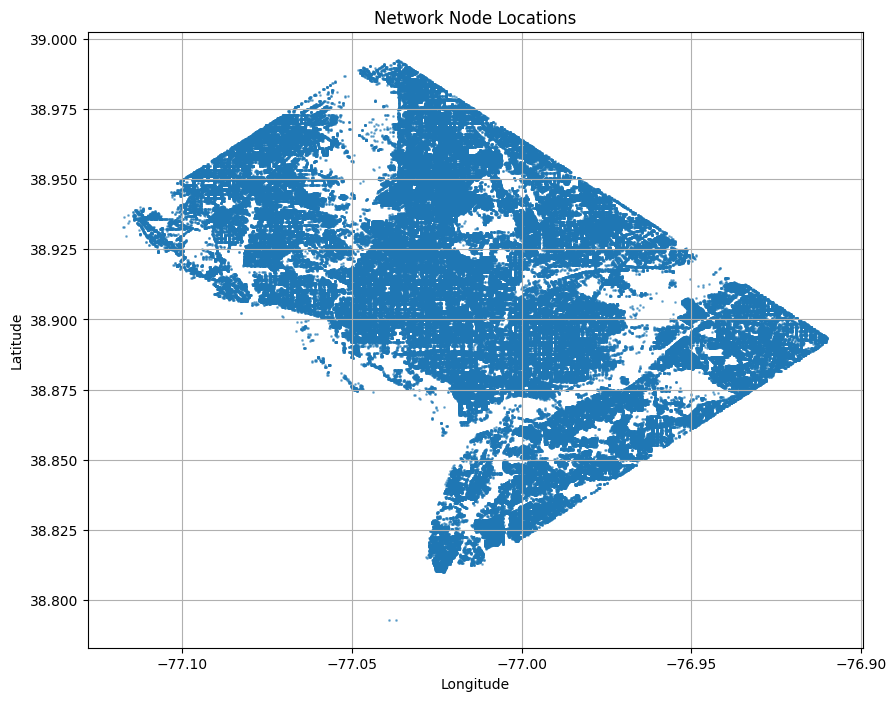

Coordinate system appears to be: Geographic (WGS84)


In [37]:
# Visualise the network extent

import matplotlib.pyplot as plt

# Plot all nodes to see the geographic extent
if nodes:
    lons = [node[0] for node in nodes]
    lats = [node[1] for node in nodes]

    plt.figure(figsize=(10, 8))
    plt.scatter(lons, lats, s=1, alpha=0.5)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Network Node Locations')
    plt.grid(True)
    plt.show()

    print(f"Coordinate system appears to be: {'Geographic (WGS84)' if -180 <= min(lons) <= max(lons) <= 180 else 'Projected/Local'}")

In [38]:
# Look at the bounds of your entire dataset
print("Dataset bounds (minx, miny, maxx, maxy):")
print(gdf.total_bounds)

# Sample some geometries to see coordinate ranges
print("\nSample coordinates from geometries:")
for idx, row in gdf.head().iterrows():
    if hasattr(row.geometry, 'coords'):
        coords = list(row.geometry.coords)
        print(f"Row {idx}: Start: {coords[0]}, End: {coords[-1]}")

Dataset bounds (minx, miny, maxx, maxy):
[-77.11752447  38.79300629 -76.90963123  38.99252138]

Sample coordinates from geometries:
Row 0: Start: (-77.03381294139159, 38.990089342936066, 0.0), End: (-77.0336998479889, 38.99000673998596, 0.0)
Row 1: Start: (-77.0336998479889, 38.99000673998596, 0.0), End: (-77.03369649996783, 38.99000347231306, 0.0)
Row 2: Start: (-77.03359438487622, 38.98990169470043, 0.0), End: (-77.03369649996783, 38.99000347231306, 0.0)
Row 3: Start: (-77.03353277032922, 38.98988791180229, 0.0), End: (-77.03337086696556, 38.9899104643647, 0.0)
Row 4: Start: (-77.03349901523409, 38.99004453256695, 0.0), End: (-77.03349923891459, 38.99004319198397, 0.0)


In [39]:
#print("Sample node:", nodes[0])
#print("Node shape:", len(nodes[0]))


Sample node: (-77.03381294139159, 38.990089342936066)
Node shape: 2


In [41]:
print(G.nodes)

[(-77.03381294139159, 38.990089342936066), (-77.0336998479889, 38.99000673998596), (-77.03369649996783, 38.99000347231306), (-77.03359438487622, 38.98990169470043), (-77.03353277032922, 38.98988791180229), (-77.03337086696556, 38.9899104643647), (-77.03349901523409, 38.99004453256695), (-77.03349923891459, 38.99004319198397), (-77.03336664578202, 38.98995587878), (-77.03335237514543, 38.98991947142323), (-77.0333178025834, 38.98995363679175), (-77.03459680951187, 38.98906894309616), (-77.03458813987106, 38.98907051132053), (-77.03438812458319, 38.989326698397626), (-77.03437294215657, 38.989314377475935), (-77.03433238591643, 38.989359250449475), (-77.03437596588581, 38.98893566484023), (-77.03436106103861, 38.98895141763374), (-77.03423417580136, 38.98888473792905), (-77.03435530373596, 38.98936360529161), (-77.0342566480565, 38.98944353827694), (-77.03427582888445, 38.989451305345256), (-77.03387232182851, 38.98979506848262), (-77.03385874648794, 38.989781832970436), (-77.03359111051